# Building a Recommendation System- Exploratory Data Analysis (EDA)

In [1]:
import os
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from yellowbrick.target import FeatureCorrelation
from statsmodels.tsa.seasonal import seasonal_decompose

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

from sklearn.decomposition import PCA
import plotly.express as px

In [2]:
df_cont= pd.read_csv('/Users/josephlim/Desktop/Data Science/Capstone Projects/Music Recommendation System- Capstone 3/Data/df_content_cleaned.csv')

In [3]:
df_cont.shape

(586601, 20)

In [4]:
df_cont.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 586601 entries, 0 to 586600
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   id                586601 non-null  object 
 1   name              586601 non-null  object 
 2   popularity        586601 non-null  int64  
 3   duration_ms       586601 non-null  int64  
 4   explicit          586601 non-null  int64  
 5   artists           586601 non-null  object 
 6   id_artists        586601 non-null  object 
 7   release_date      586601 non-null  int64  
 8   danceability      586601 non-null  float64
 9   energy            586601 non-null  float64
 10  key               586601 non-null  int64  
 11  loudness          586601 non-null  float64
 12  mode              586601 non-null  int64  
 13  speechiness       586601 non-null  float64
 14  acousticness      586601 non-null  float64
 15  instrumentalness  586601 non-null  float64
 16  liveness          58

In [5]:
df_cont.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.7440,0.151,0.127,104.851,3
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.0000,0.148,0.655,102.009,1
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.0218,0.212,0.457,130.418,5
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.9180,0.104,0.397,169.980,3
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.1300,0.311,0.196,103.220,4


In [6]:
df_cont= df_cont.rename(columns={'release_date':'year'})

## Feature Correlation

We will explore correlations between different combinations of features.

#### Correlation Between Different Features and Popularity

 Before we go into an in-depth analysis, let's explore correlations between features.

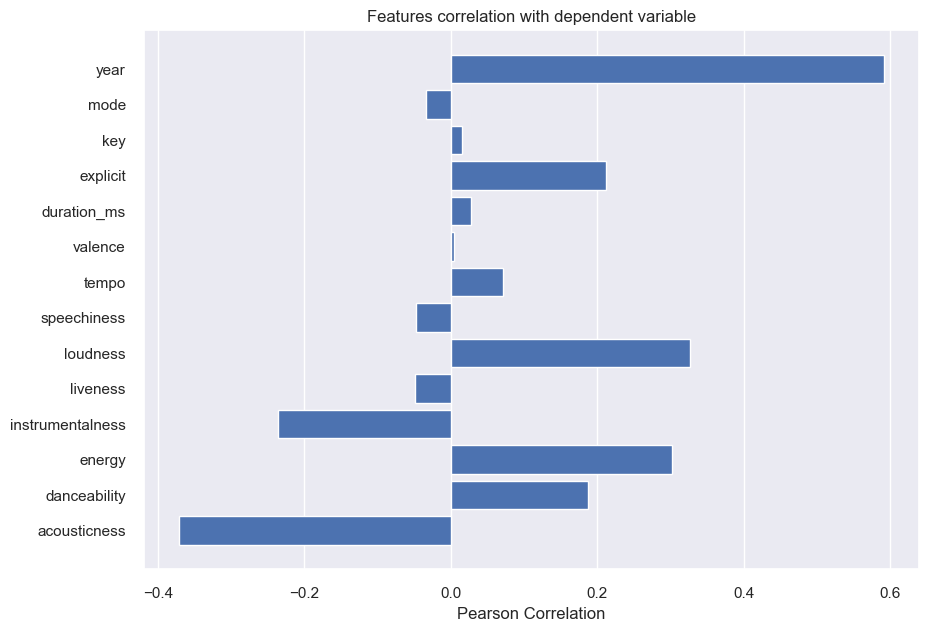

<AxesSubplot: title={'center': 'Features correlation with dependent variable'}, xlabel='Pearson Correlation'>

In [7]:
feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','mode','year']

sns.set(font_scale=1)
X= df_cont[feature_names]
y= df_cont['popularity']

features= np.array(X.columns)
visualizer= FeatureCorrelation(labels= features)

plt.rcParams['figure.figsize']=(10, 7)
visualizer.fit(X, y)
visualizer.show()

We don't see any feature that has noticeable correlation with popularity other than year. Even in year, there is only a moderate correlation less than 0.6.

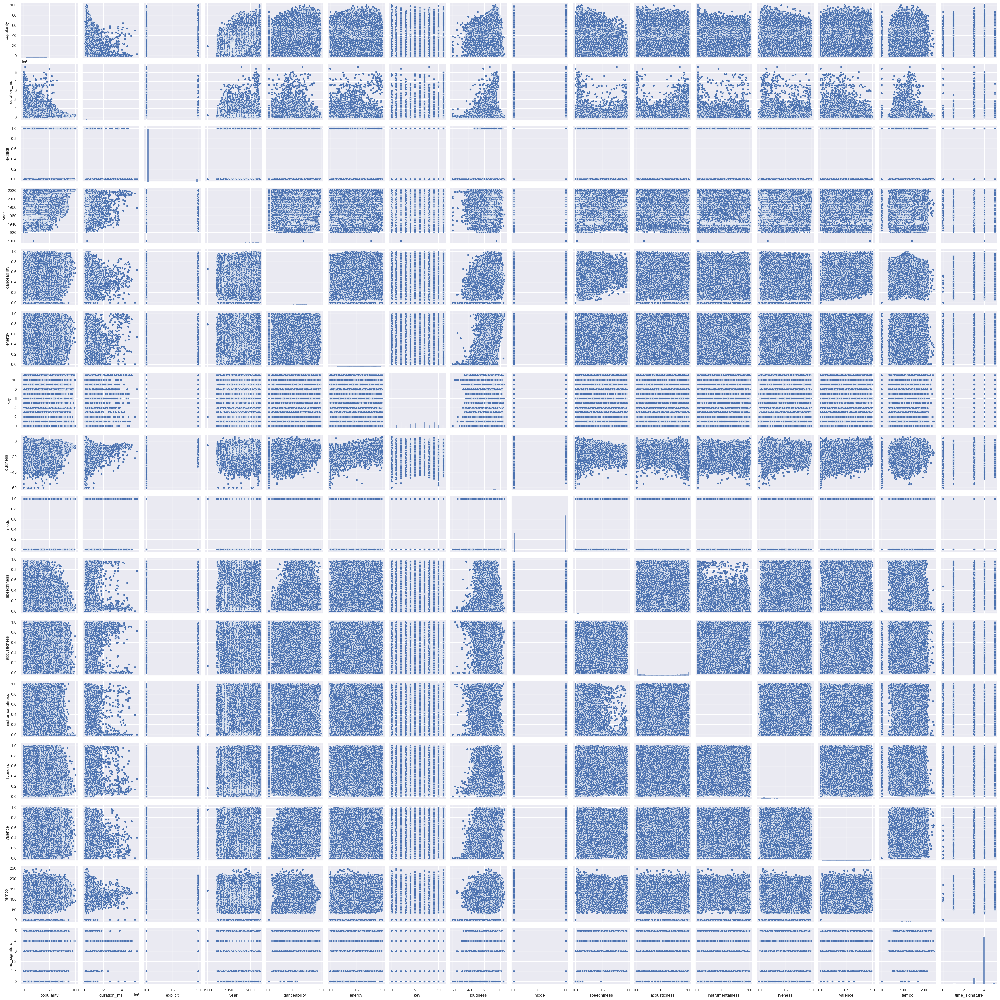

In [8]:
g= sns.pairplot(df_cont)
plt.show()

Seems like we have very little to no correlation between features, but it's a bit difficult to tell. Let's try to visualize this using heatmap.

/var/folders/z9/t15ddpld70nc5qf41442lpr80000gn/T/ipykernel_2775/4023651303.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df_cont.corr(), linewidths=0.1, cmap='YlGnBu', annot=True)


(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5]),
 [Text(0, 0.5, 'popularity'),
  Text(0, 1.5, 'duration_ms'),
  Text(0, 2.5, 'explicit'),
  Text(0, 3.5, 'year'),
  Text(0, 4.5, 'danceability'),
  Text(0, 5.5, 'energy'),
  Text(0, 6.5, 'key'),
  Text(0, 7.5, 'loudness'),
  Text(0, 8.5, 'mode'),
  Text(0, 9.5, 'speechiness'),
  Text(0, 10.5, 'acousticness'),
  Text(0, 11.5, 'instrumentalness'),
  Text(0, 12.5, 'liveness'),
  Text(0, 13.5, 'valence'),
  Text(0, 14.5, 'tempo'),
  Text(0, 15.5, 'time_signature')])

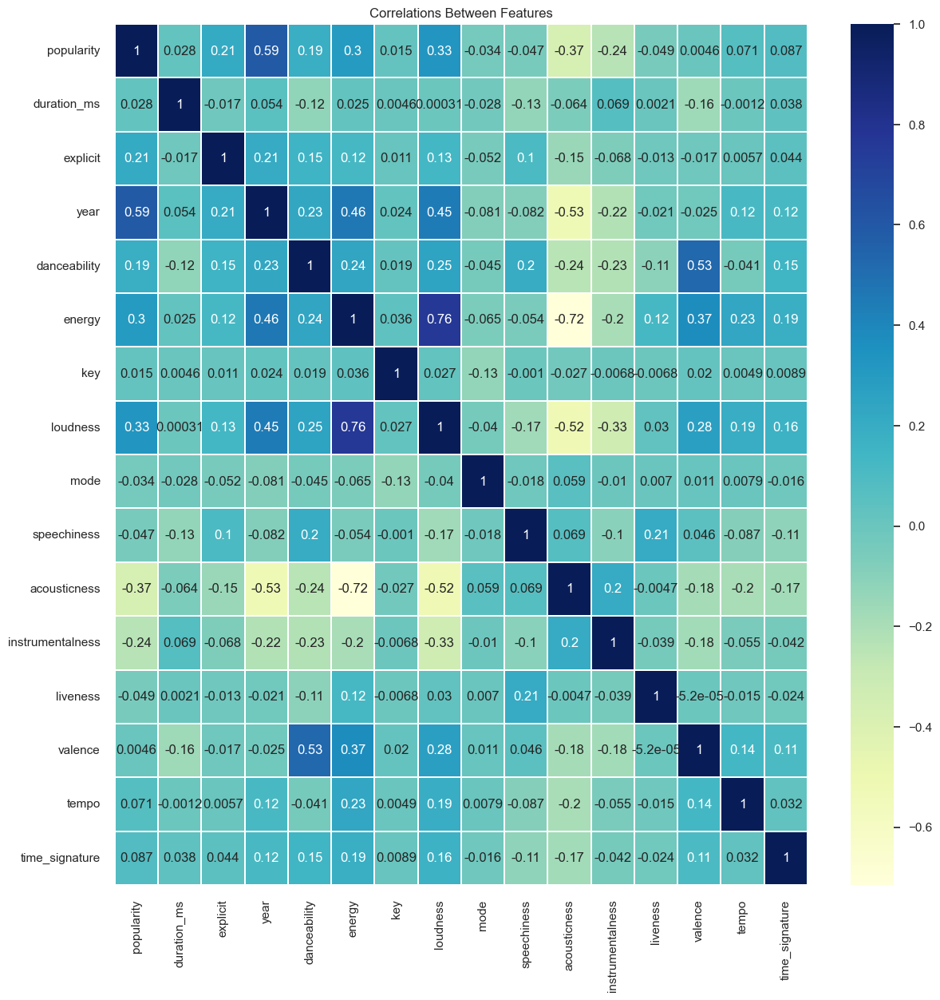

In [9]:
plt.figure(figsize=(14,14))
sns.heatmap(df_cont.corr(), linewidths=0.1, cmap='YlGnBu', annot=True)
plt.title(label='Correlations Between Features')
plt.yticks(rotation=0)

There is a *strong* correlation (0.76) between **energy** and **loudness**. There is also a *moderate* correlation  between **danceability** and **valence** (0.53).  

## Number of Songs 

<AxesSubplot: title={'center': 'Number of Songs Throughout Time'}, xlabel='decade', ylabel='count'>

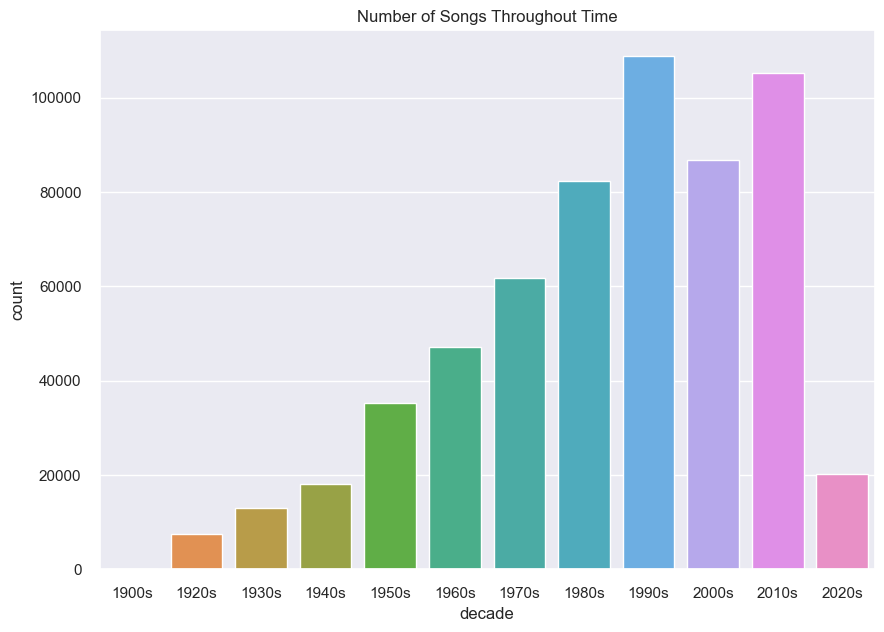

In [10]:
def get_decade(year):
    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)
    return decade

df_cont['decade'] = df_cont['year'].apply(get_decade)
df_sort= df_cont.sort_values('decade')

plt.title('Number of Songs Throughout Time')

sns.set(rc={'figure.figsize':(10 ,5)})
sns.countplot(data= df_sort, x='decade')

We can see that number of top-charting songs increase logarithmically until 1990s. We then have slight drop in them around 2000s, followed by a slight recovery in 2010s. Very few songs in 2020s, but this makes sense, given that we're still in early 2020s. Let's see how different audio features change throughout the years.
<br>
<br> We also see that there were very few songs in 1900s. Let's explore that a bit.

In [11]:
years= df_cont['year'].unique().tolist()
years.sort()

print(years)

[1900, 1922, 1923, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931, 1932, 1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942, 1943, 1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021]


The only year we have in 1900s is 1900. 

In [12]:
df_1900= df_cont.loc[df_cont['year']==1900]
len(df_1900)

1

We only have one song in 1900s. That explains why we weren't able to see any observation earlier. Let's see how each audio features changed throughout the time.

## Audio Features Throughout the Time

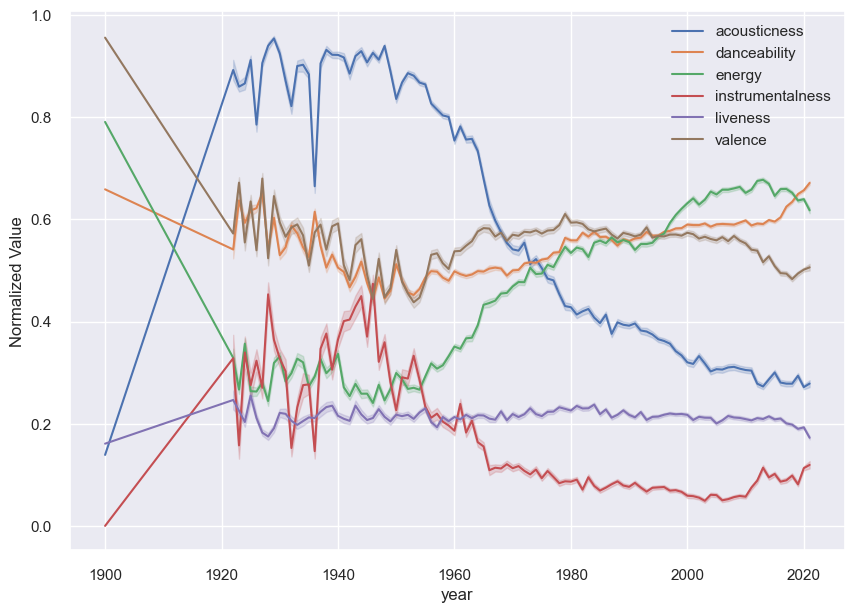

In [13]:
audio_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']

plt.figure(figsize=(10,7))

for i in audio_features:
    sns.lineplot(data=df_cont, x='year', y=i, label= str(i))

plt.ylabel('Normalized Value')
plt.legend()

We will ignore trends before 1922, since we only have one observation before 1922. Songs were high in **acousticness** around 1920s-1950s. The acousticness started showing downward trend from then on. **Valence** and **danceability** values show close resemblance through 1920s-1960s. They then show slight divergence, but both with upward trends until 1990s. Valence and danceability then shows another divergence, with danceability increasing, while valence decreasing. **Energy** remains consistent throughout 1920s-1950s, staying around 0.3. It then experienced constant upward trend until 2020s. **Liveness** stays consistent around 0.2 throughout 1920s-2020s. **Instrumentalness** hovers aroud 0.2-0.4 between 1920-1950, then decreases until 1970s, then stays around 0.1 until 2020.

## Visualizing Clusters

Since we are working with high-volume, high-dimensional data, it would be useful to perform dimensional reduction, cluster and visualize our data. We will use k-means clustering to cluster our data and PCA to visualize our clusters.

### K-Means Clustering

In [14]:
KMeans_pipe= Pipeline([('scaler', StandardScaler()), ('KMeans', KMeans())])
X= df_cont.select_dtypes(np.number)
num_cols= X.columns.to_list()

KMeans_pipe.fit(X)
cluster_labels= KMeans_pipe.predict(X)
df_cont['cluster_labels']= cluster_labels

### Visualizing Clusters via PCA

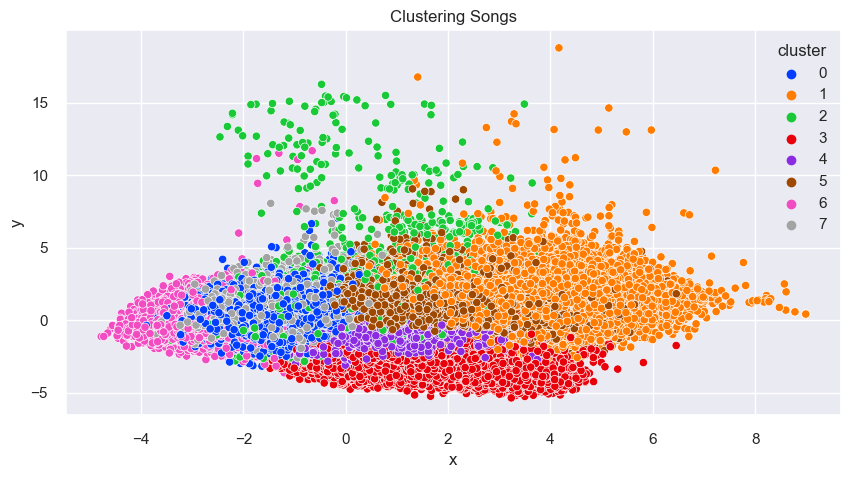

In [15]:
pca_pipeline= Pipeline([('scaler', StandardScaler()),('PCA', PCA(n_components=2))])
transformed_data= pca_pipeline.fit_transform(X)

projection= pd.DataFrame(columns= ['x','y'], data= transformed_data)
projection['title']= df_cont['name']
projection['cluster']= df_cont['cluster_labels']


sns.scatterplot(data= projection, x= 'x', y= 'y', hue='cluster', palette='bright')
plt.title('Clustering Songs')

plt.show()

In [16]:
projection.cluster.nunique()

8

## Collaborative Filtering

In [17]:
df_collab= pd.read_csv('/Users/josephlim/Desktop/Data Science/Capstone Projects/Music Recommendation System- Capstone 3/Data/df_collab_cleaned.csv')

In [18]:
df_collab.shape

(12856838, 4)

In [19]:
df_collab.head()

,user_id,artistname,trackname,playlistname
0,9cc0cfd4d7d7885102480dd99e7a90d6,Elvis Costello,(The Angels Wanna Wear My) Red Shoes,HARD ROCK 2010
1,9cc0cfd4d7d7885102480dd99e7a90d6,Elvis Costello & The Attractions,"(What's So Funny 'Bout) Peace, Love And Unders...",HARD ROCK 2010
2,9cc0cfd4d7d7885102480dd99e7a90d6,Tiffany Page,7 Years Too Late,HARD ROCK 2010
3,9cc0cfd4d7d7885102480dd99e7a90d6,Elvis Costello & The Attractions,Accidents Will Happen,HARD ROCK 2010
4,9cc0cfd4d7d7885102480dd99e7a90d6,Elvis Costello,Alison,HARD ROCK 2010


In [20]:
df_collab.describe()

,user_id,artistname,trackname,playlistname
count,12856838,12856838,12856838,12856838
unique,15914,289603,2004523,157320
top,4398de6902abde3351347b048fcdc287,Daft Punk,Intro,Starred
freq,295274,36086,6675,1334319


Let's visualize the data to better understand the data.

Text(0.5, 1.0, 'Number of Unique Listeners and Music')

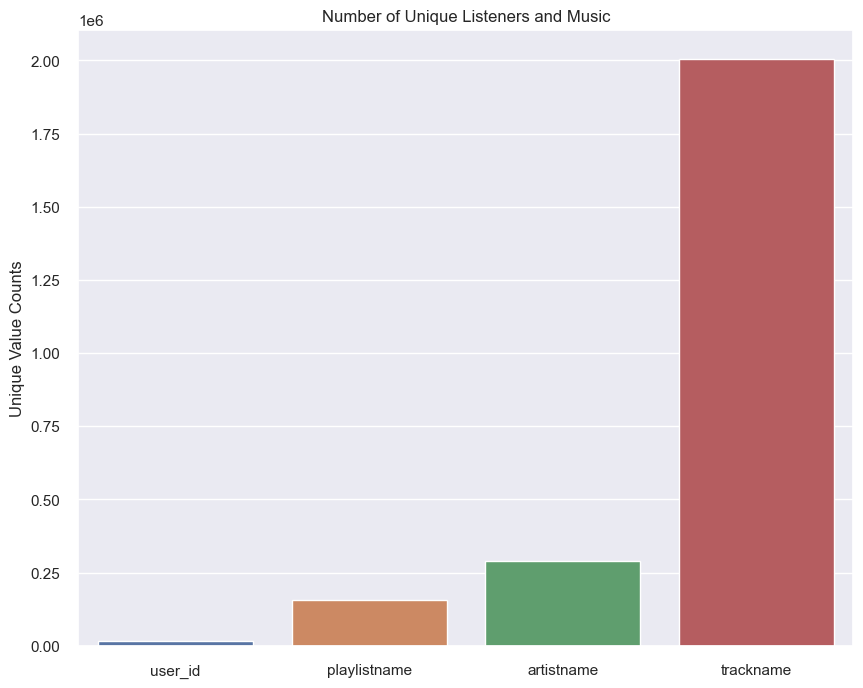

In [21]:
plt.figure(figsize=(10,8))

sns.barplot(x= [x for x in df_collab.columns], y= [df_collab[x].nunique() for x in df_collab.columns], order=['user_id', 'playlistname', 'artistname', 'trackname'] )
plt.ylabel('Unique Value Counts')
plt.title('Number of Unique Listeners and Music')

Although overall counts are the same, we can see that there are more unique tracks and artist names than listeners and playlists. This makes sense, given that listeners tend to add more than one songs to each of their playlists. We can also see that there are more playlists than listeners. This may be from listeners with more than one playlists. Finally, there are more tracks than artists. This may be because listeners may save more than one track by a given artist (hence favorite artist(s))! 